In [56]:
import matplotlib.pyplot as plt
import pandas as pd

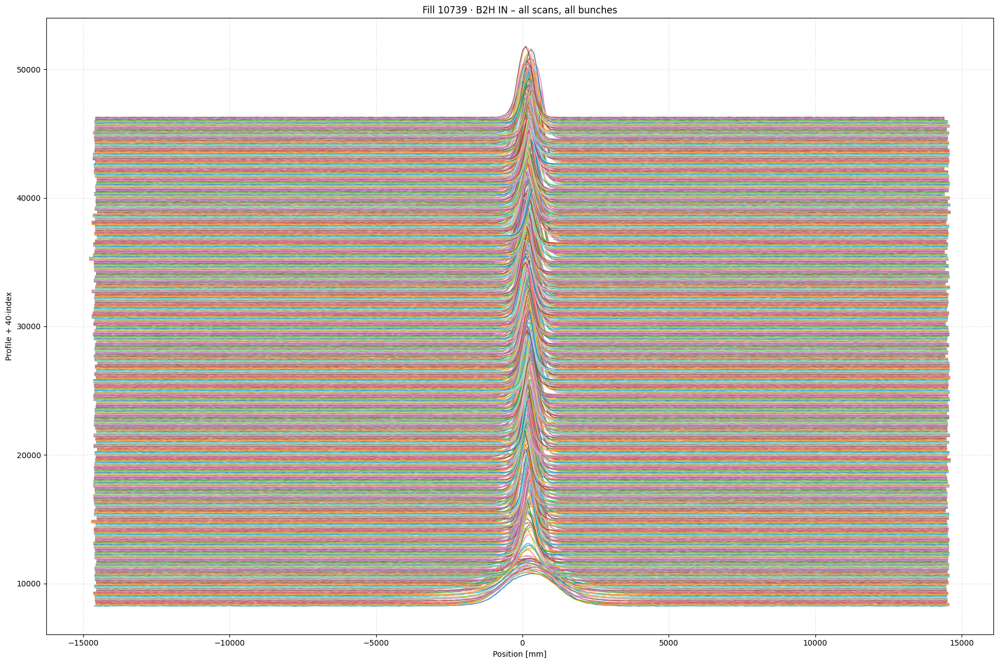

In [57]:
REPDIR = '/eos/project/l/lhc-lumimod/LuminosityFollowUp/2025/ws_analysis'
fno = 10739

# --- load data : it loads a dictionary for the WS data of the fill
wdpkl = pd.read_pickle(f'{REPDIR}/Fill{fno}/Analysis_LHC_WS_fill{fno}.pkl')
wdpkl.keys()
device = 'B2H'
scan = 'IN'

wscan_df = wdpkl[device][scan]
wscan_df.head()
import numpy as np
import matplotlib.pyplot as plt

# ---------------------------------------------------
yoffset  = 40                  # vertical spacing between successive traces
figsize  = (18, 12)            # big canvas for many profiles
lw       = 1.0                 # line width
cmap     = plt.cm.tab20        # re‑use colours every 20 traces
# ---------------------------------------------------

fig, ax = plt.subplots(figsize=figsize)

global_idx = 0   # counts every profile we plot, across scans and bunches

for tstamp, row in wscan_df.iterrows():                           # loop over scans
    bids   = row[f'slots {device} {scan}']                        # bunch IDs
    xpos   = row[f'positions {device} {scan}']                    # list of x‑arrays
    yprof  = row[f'profiles {device} {scan}']                     # list of y‑arrays

    for b_idx, (x, y) in enumerate(zip(xpos, yprof)):             # loop over bunches
        ax.plot(x, y + global_idx*yoffset,
                lw=lw,
                color=cmap(global_idx % cmap.N))
        global_idx += 1

# ----------------------- cosmetics -------------------------------
ax.set_title(f'Fill {fno} · {device} {scan} – all scans, all bunches')
ax.set_xlabel('Position [mm]')
ax.set_ylabel(f'Profile + {yoffset}·index')
ax.grid(True, which='both', ls='--', alpha=0.3)

# Optional: label only the first N traces to avoid legend bloat
# ax.legend(fontsize=8, ncol=5, frameon=False, loc='upper right')

plt.tight_layout()
plt.show()


In [58]:
# ====================== INSPECT FIT WINDOWS ======================

def mm(um): 
    return um / 1000.0

print("\n=== Fit window per phase (energy-scaled) ===")
for ph, win in phase_windows.items():
    ts_start = win["start"]
    ts_end   = win["end"]
    ts_mid   = ts_start + (ts_end - ts_start) / 2

    # raw = no clipping (min_win_um=0), clip = default min/max from fit_window_um
    w_raw_start = fit_window_um(ts_start, phase_windows, min_win_um=0)
    w_raw_mid   = fit_window_um(ts_mid,   phase_windows, min_win_um=0)
    w_raw_end   = fit_window_um(ts_end,   phase_windows, min_win_um=0)
    w_clip_mid  = fit_window_um(ts_mid,   phase_windows)  # with default clipping

    print(f"{ph:8s} start {ts_start}  Δx_raw = ±{w_raw_start:>6.0f} µm ({mm(w_raw_start):5.2f} mm)")
    print(f"{'':8s} mid   {ts_mid}  Δx_raw = ±{w_raw_mid:>6.0f} µm ({mm(w_raw_mid):5.2f} mm)   "
          f"Δx_clip = ±{w_clip_mid:>6.0f} µm")
    print(f"{'':8s} end   {ts_end}  Δx_raw = ±{w_raw_end:>6.0f} µm ({mm(w_raw_end):5.2f} mm)")

print("\n=== Fit window for selected scans (per phase) ===")
for ph, stamps in phase_scans.items():
    print(f"{ph}:")
    for ts in stamps:
        w_clip = fit_window_um(ts, phase_windows)          # with clipping
        w_raw  = fit_window_um(ts, phase_windows, min_win_um=0)  # no clipping
        print(f"  {ts}  Δx_clip = ±{w_clip:>6.0f} µm   (raw ±{w_raw:>6.0f} µm)")



=== Fit window per phase (energy-scaled) ===
INJPHYS  start 2025-06-20 00:35:28.146238525+00:00  Δx_raw = ±  5000 µm ( 5.00 mm)
         mid   2025-06-20 00:46:07.474095262+00:00  Δx_raw = ±  5000 µm ( 5.00 mm)   Δx_clip = ±  5000 µm
         end   2025-06-20 00:56:46.801952+00:00  Δx_raw = ±  5000 µm ( 5.00 mm)
RAMP     start 2025-06-20 00:58:24.551238525+00:00  Δx_raw = ±  5000 µm ( 5.00 mm)
         mid   2025-06-20 01:09:07.062168762+00:00  Δx_raw = ±  1763 µm ( 1.76 mm)   Δx_clip = ±  2500 µm
         end   2025-06-20 01:19:49.573099+00:00  Δx_raw = ±  1287 µm ( 1.29 mm)
FLATTOP  start 2025-06-20 01:19:49.608863525+00:00  Δx_raw = ±  1287 µm ( 1.29 mm)
         mid   2025-06-20 01:22:59.634431762+00:00  Δx_raw = ±  1287 µm ( 1.29 mm)   Δx_clip = ±  2500 µm
         end   2025-06-20 01:26:09.660000+00:00  Δx_raw = ±  1287 µm ( 1.29 mm)
STABLE   start 2025-06-20 01:53:57.456613525+00:00  Δx_raw = ±  1287 µm ( 1.29 mm)
         mid   2025-06-20 04:31:24.403801025+00:00  Δx_raw = ±  

Loaded WS table for B2V IN: 138 scans


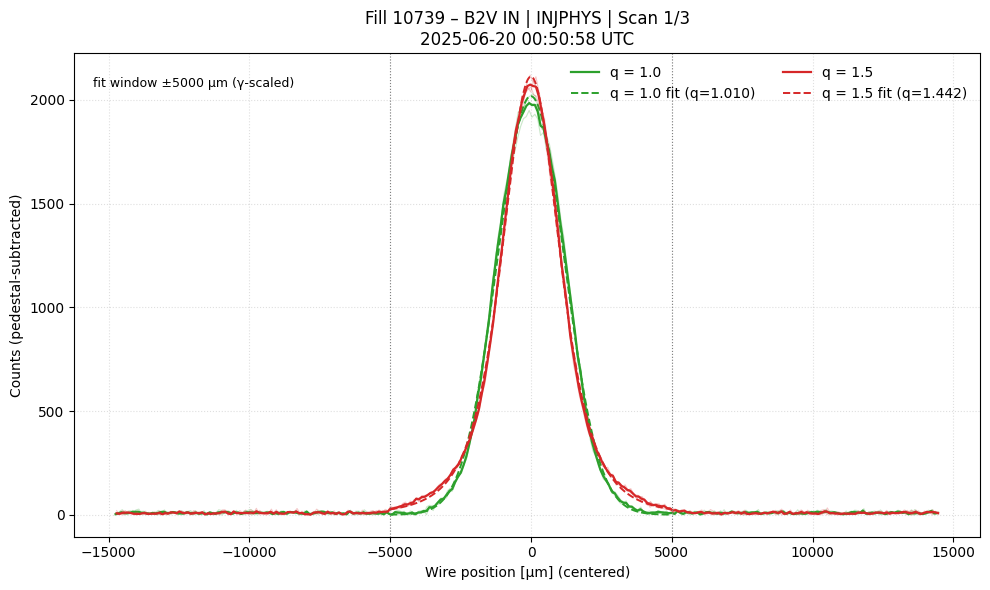

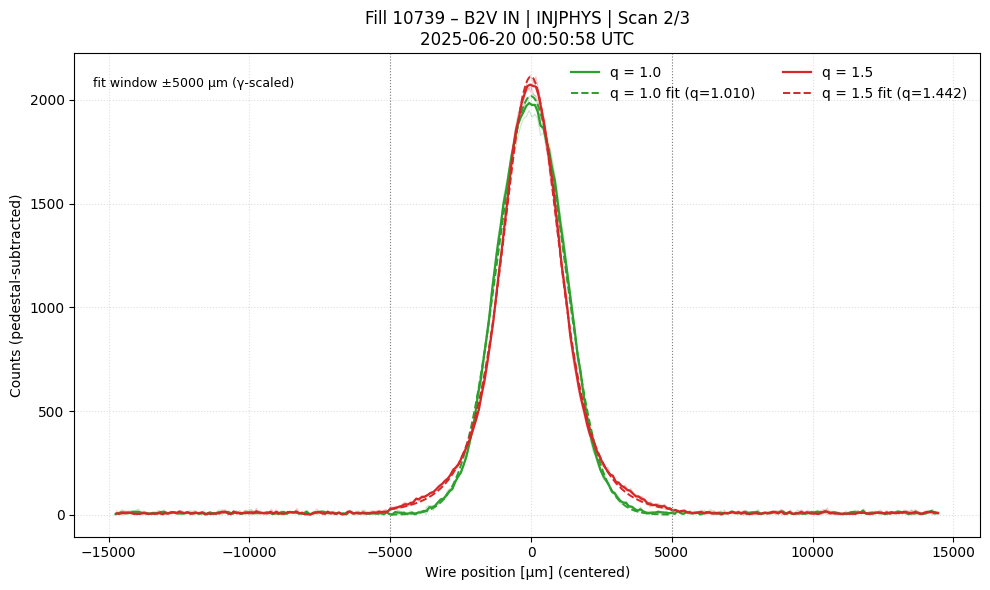

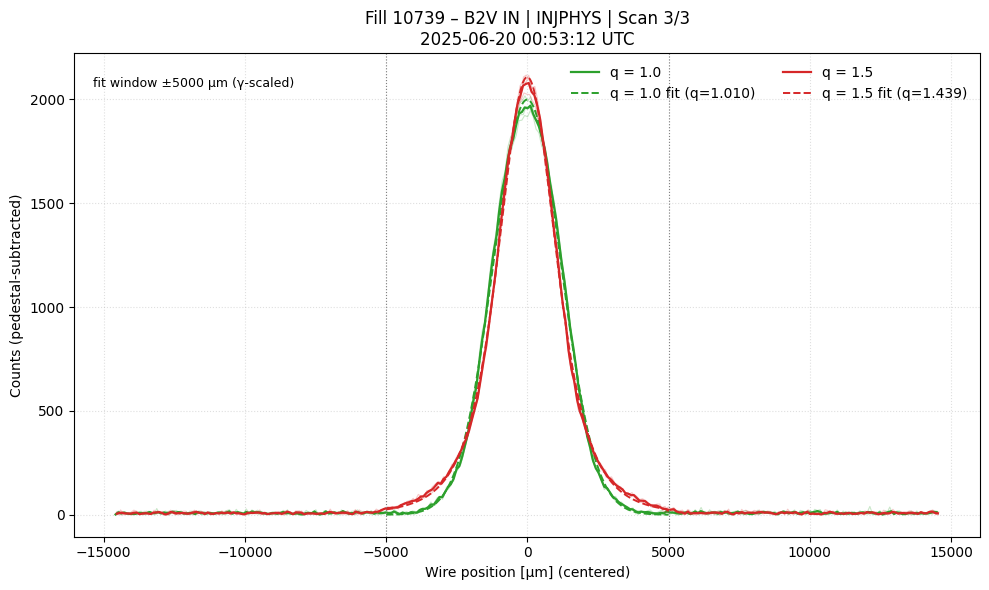

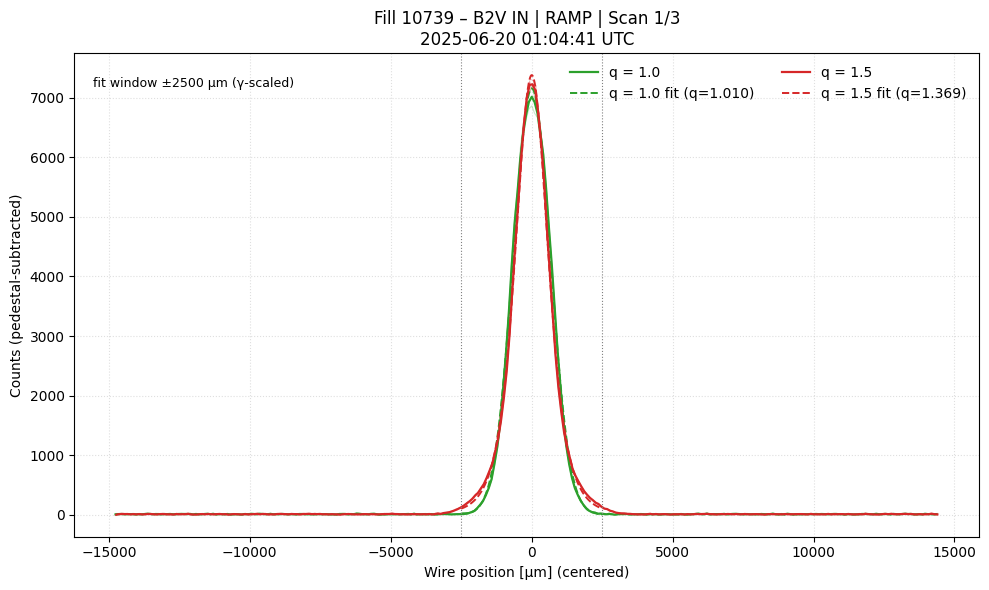

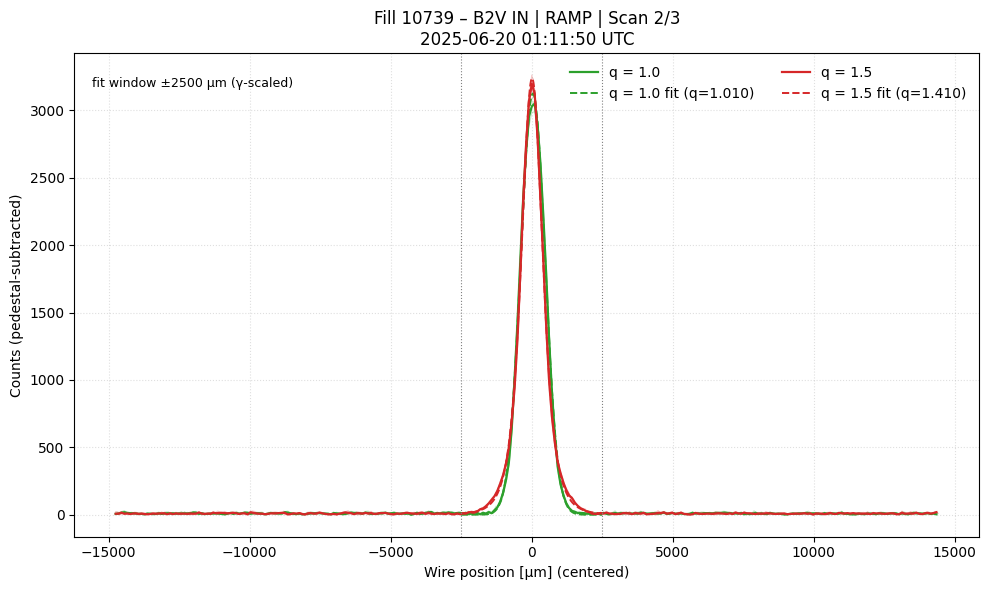

...

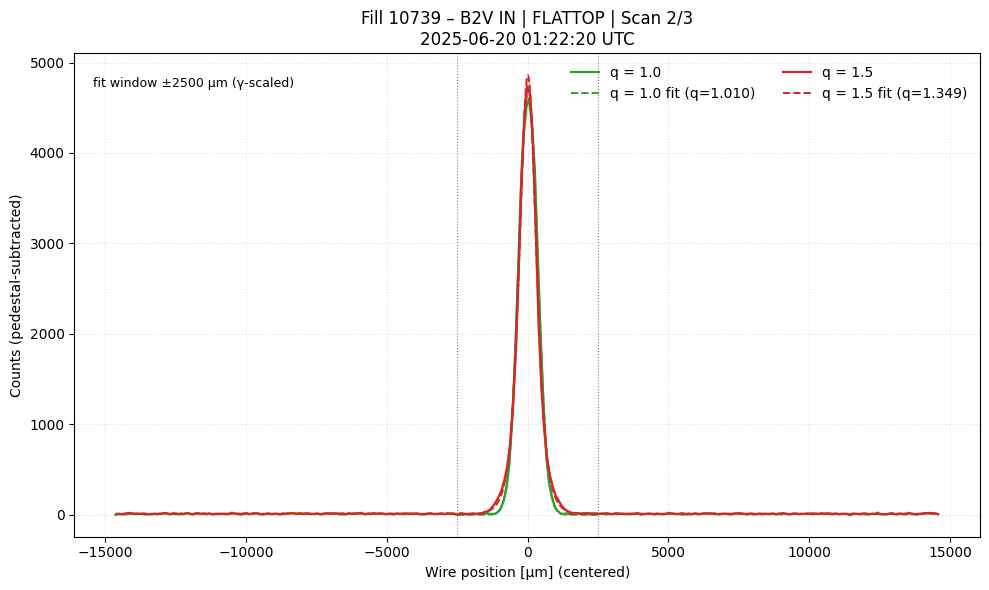

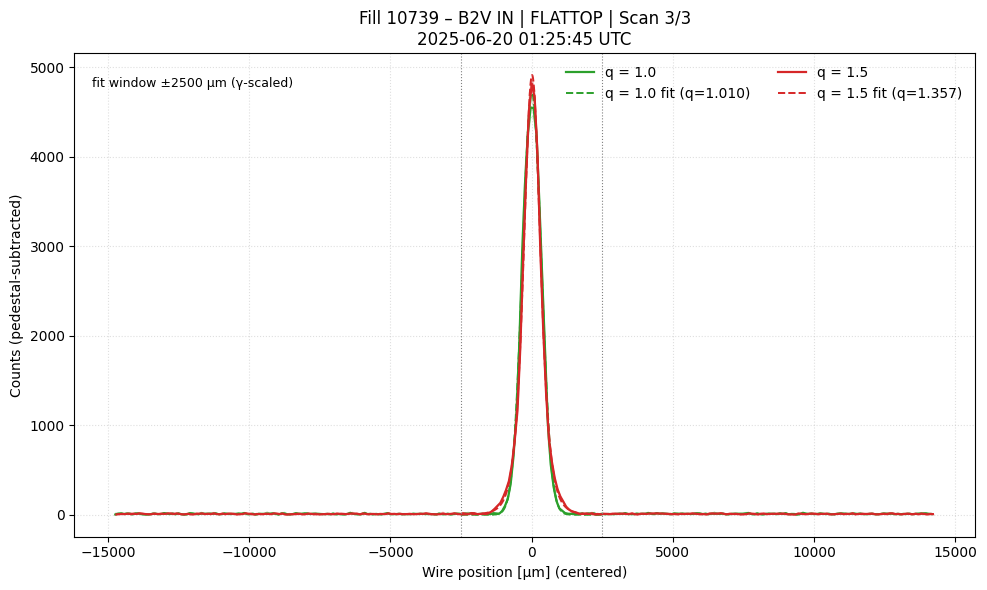

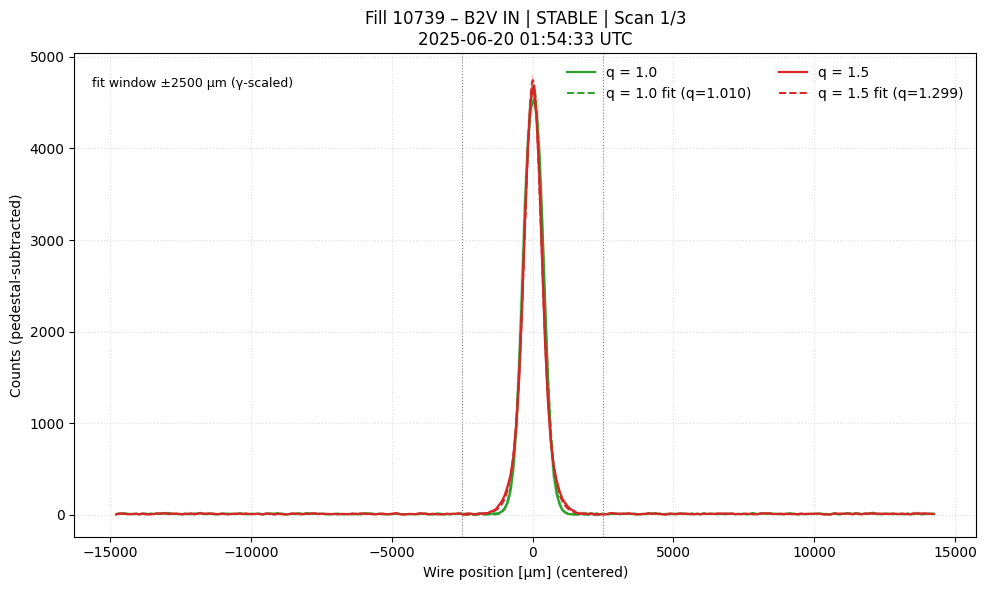

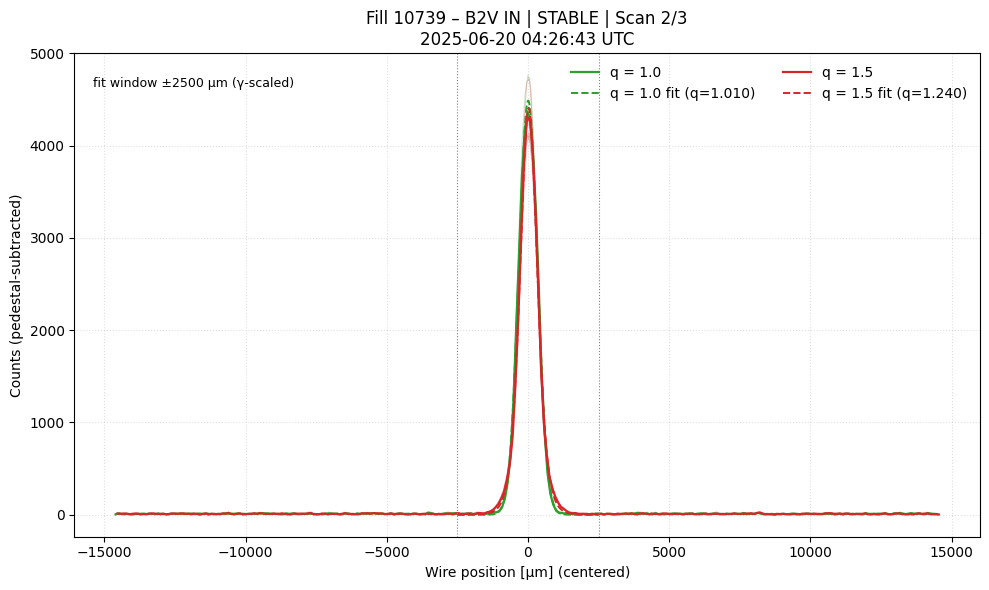

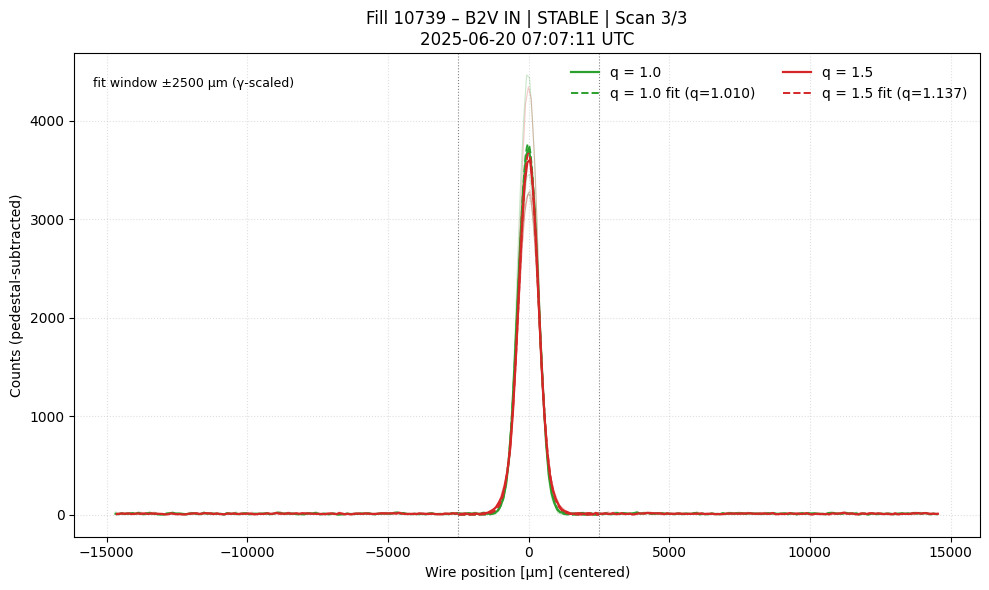

In [59]:
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import re
import warnings
from scipy.optimize import curve_fit

warnings.filterwarnings("ignore", category=RuntimeWarning)

FILL      = 10739
DEVICE    = "B2V"                # "B1H" or "B2H"
SCAN_KEY  = "IN"                 # WS key in the pickle ("IN" = scans-in)
PHASES    = ["INJPHYS", "RAMP", "FLATTOP", "STABLE"]
N_SCANS   = 3                    # timestamps per phase to plot

# groups per beam
GROUPS_B1 = {"q = 1.0": [21, 501,  751],
             "q = 1.5": [1251, 1801, 2251]}
GROUPS_B2 = {"q = 1.0": [21, 501, 1051],
             "q = 1.5": [1251, 1801, 2501]}
GROUPS    = GROUPS_B1 if DEVICE.startswith("B1") else GROUPS_B2
NEEDED    = set(sum(GROUPS.values(), []))    # all bunch IDs (for INJPHYS gate)

# selection / appearance
MIN_INJPHYS_TIME = pd.Timestamp("2025-06-20 00:45:00", tz="UTC")
LINEWIDTH   = 1.6
ALPHA_BUNCH = 0.25
COLORS      = {"q = 1.0": "tab:green", "q = 1.5": "tab:red"}

# paths
DATADIR   = Path("/eos/project/l/lhc-lumimod/LuminosityFollowUp/md_data/MD15363")
REPDIR    = Path("/eos/project/l/lhc-lumimod/LuminosityFollowUp/2025/ws_analysis")
# ===========================================================


# ----------------------- q-Gaussian ------------------------
def q_gauss(x, A, mu, beta, q):
    """
    Heavy-tailed Tsallis q-Gaussian for 1 < q < 3:
        f(x) = A * [1 + (q-1)*beta*(x-mu)^2]^(-1/(q-1))
    Gaussian limit as q->1: A * exp(-beta*(x-mu)^2)
    """
    x = np.asarray(x, dtype=float)
    z = 1.0 + (q - 1.0) * beta * (x - mu)**2
    z = np.where(z > 1e-14, z, 1e-14)  # prevent tiny/negative
    return A * z ** (-1.0 / (q - 1.0))


# ---------------------- utilities --------------------------
def find_col(cols, prefix, tag):
    pat = re.compile(rf"^{prefix}\s*{re.escape(tag)}$", re.I)
    for c in cols:
        if pat.match(re.sub(r"\s+", " ", c)):
            return c
    raise KeyError(f"Column not found: '{prefix} {tag}'")

def pedestal_subtract(y, frac=0.10):
    ped = np.quantile(y, frac)
    y0  = y - ped
    y0[y0 < 0] = 0
    return y0

def centre_profile(x, y):
    s = y.sum()
    if s <= 0:
        return x, y, np.nan
    mu = (x * y).sum() / s
    return x - mu, y, mu


# ---------------------- energy & scaling --------------------
# Proton rest mass [GeV]
M0_GEV = 0.938272081

def gamma_from_energy(E_GeV: float) -> float:
    """Relativistic gamma for protons from kinetic energy in GeV."""
    return 1.0 + (E_GeV / M0_GEV)

# Reference fit half-window at injection (±ref_win in µm)
REF_WIN_UM = 5000.0
GAMMA_INJ  = gamma_from_energy(450.0)

def piecewise_energy_from_phase(ts: pd.Timestamp,
                                phase_windows: dict,
                                E_inj_GeV: float = 450.0,
                                E_flat_GeV: float = 6800.0) -> float:
    """
    Simple energy model from phase windows:
      INJPHYS             → E_inj_GeV
      RAMP                → linear from E_inj_GeV to E_flat_GeV
      FLATTOP or STABLE   → E_flat_GeV
    """
    phase_of_ts = None
    for ph, win in phase_windows.items():
        if win["start"] <= ts <= win["end"]:
            phase_of_ts = ph
            break
    if phase_of_ts is None:
        return E_inj_GeV
    if phase_of_ts == "INJPHYS":
        return E_inj_GeV
    if phase_of_ts in ("FLATTOP", "STABLE"):
        return E_flat_GeV
    if phase_of_ts == "RAMP":
        t0, t1 = phase_windows["RAMP"]["start"], phase_windows["RAMP"]["end"]
        if t1 <= t0:
            return E_inj_GeV
        alpha = (ts - t0) / (t1 - t0)   # in [0,1]
        return (1 - alpha) * E_inj_GeV + alpha * E_flat_GeV
    return E_inj_GeV

def fit_window_um(ts: pd.Timestamp,
                  phase_windows: dict,
                  ref_win_um: float = REF_WIN_UM,
                  gamma_inj: float = GAMMA_INJ,
                  beta_ratio: float = 1.0,
                  min_win_um: float = 2500.0,
                  max_win_um: float = 30000.0) -> float:
    """
    Return Δx(ts) (µm) so the fit window is |x| ≤ Δx(ts),
    scaled as ref_win * sqrt(gamma_inj/gamma(ts)) * sqrt(beta_ratio).
    If you know β_WS per phase, pass beta_ratio = β_WS(ts)/β_WS(inj).
    """
    E = piecewise_energy_from_phase(ts, phase_windows)
    g = gamma_from_energy(E)
    scale = np.sqrt(gamma_inj / max(g, 1.0))
    width = ref_win_um * scale * np.sqrt(max(beta_ratio, 1e-6))
    return float(np.clip(width, min_win_um, max_win_um))


# ---------------------- load WS scans ----------------------
ws_pkl   = REPDIR / f"Fill{FILL}" / f"Analysis_LHC_WS_fill{FILL}.pkl"
wsdf     = pd.read_pickle(ws_pkl)[DEVICE][SCAN_KEY].sort_index()
wsdf.index = wsdf.index.tz_localize("UTC")

base_tag = f"{DEVICE} {SCAN_KEY}"
pos_c, prof_c, slot_c = (find_col(wsdf.columns, k, base_tag)
                         for k in ("positions", "profiles", "slots"))

print(f"Loaded WS table for {DEVICE} {SCAN_KEY}: {len(wsdf)} scans")


# ---------------------- phase windows (MD) -----------------
def first_interval(bmode):
    folder = DATADIR / f"HX:FILLN={FILL}" / f"HX:BMODE={bmode}"
    t0 = t1 = None
    for pq in folder.rglob("*.parquet"):
        try:
            df  = pd.read_parquet(pq)
            idx = pd.to_datetime(df.index, utc=True, errors="coerce").dropna()
            if idx.empty:
                continue
            lo, hi = idx.min(), idx.max()
            t0 = lo if t0 is None else min(t0, lo)
            t1 = hi if t1 is None else max(t1, hi)
        except Exception:
            continue
    return None if t0 is None else pd.Series({"start": t0, "end": t1})

phase_windows = {ph: first_interval(ph) for ph in PHASES}
phase_windows = {ph: w for ph, w in phase_windows.items() if w is not None}


# ---------------------- choose scans per phase --------------
def pick_scans(window, require_all=False, min_time=None, n=N_SCANS):
    scans = wsdf.loc[window["start"]: window["end"]]
    if min_time is not None:
        scans = scans[scans.index >= min_time]
    if require_all:
        scans = scans[scans[slot_c].apply(lambda s: set(map(int, s)).issuperset(NEEDED))]
    if scans.empty:
        return []
    idxs = np.round(np.linspace(0, len(scans) - 1, n)).astype(int)
    return [scans.index[i] for i in idxs]

phase_scans = {}
for ph, win in phase_windows.items():
    req_all = (ph == "INJPHYS")
    min_t   = MIN_INJPHYS_TIME if ph == "INJPHYS" else None
    stamps  = pick_scans(win, require_all=req_all, min_time=min_t, n=N_SCANS)
    if stamps:
        phase_scans[ph] = stamps


# --------------- fit & overlay for each timestamp ----------
def fit_q_gaussian_to_group(row, bunch_ids, color, ax, label, ts_for_window, beta_ratio=1.0):
    """
    • plot faint individual bunch traces (ped-subtracted & centered),
    • plot the group mean (solid),
    • fit the q-Gaussian on an energy-scaled window |x| ≤ Δx(ts), overlay dashed.
    Returns (q, beta, mu, A, win_um) or None if fit fails.
    """
    slots = list(map(int, row[slot_c]))
    xall  = row[pos_c]
    yall  = row[prof_c]

    xs = []
    ys = []
    for b in bunch_ids:
        if b not in slots:
            continue
        j  = slots.index(b)
        xr = np.asarray(xall[j], dtype=float)
        yr = pedestal_subtract(np.asarray(yall[j], dtype=float))
        xc, yc, _ = centre_profile(xr, yr)
        o = np.argsort(xc)
        xc, yc = xc[o], yc[o]
        xs.append(xc)
        ys.append(yc)
        ax.plot(xc, yc, color=color, alpha=ALPHA_BUNCH, lw=0.8)  # raw bunch

    if not xs:
        return None

    # align on the first bunch grid
    x_ref = xs[0]
    Y = [np.interp(x_ref, xi, yi, left=0, right=0) for xi, yi in zip(xs, ys)]
    y_mean = np.mean(np.vstack(Y), axis=0)

    # draw group mean
    ax.plot(x_ref, y_mean, color=color, lw=LINEWIDTH, label=label)

    # --------- energy-scaled fit window ----------
    win_um = fit_window_um(ts_for_window, phase_windows, beta_ratio=beta_ratio)
    msk    = np.abs(x_ref) <= win_um
    if not np.any(msk):
        msk = slice(None)

    # --------- robust initial guesses ----------
    A0   = float(y_mean[msk].max())
    mu0  = 0.0
    s    = float(y_mean[msk].sum())
    sig0 = (np.sqrt(np.sum((x_ref[msk] - mu0)**2 * y_mean[msk]) / s)
            if s > 0 else max(x_ref.ptp()/10, 1000.0))
    beta0 = 1.0 / (2.0 * max(sig0, 1.0)**2)   # Gaussian limit mapping
    q0    = 1.10
    p0    = (A0, mu0, beta0, q0)
    bounds= ([0.0, -5e3, 1e-12, 1.01], [np.inf, 5e3, np.inf, 2.5])

    try:
        popt, _ = curve_fit(q_gauss,
                            x_ref[msk], y_mean[msk],
                            p0=p0, bounds=bounds, maxfev=20000)
        A, mu, beta, q = popt
        xfit = np.linspace(-win_um, win_um, 1200)
        ax.plot(xfit, q_gauss(xfit, *popt), color=color, ls="--", lw=1.4,
                label=f"{label} fit (q={q:.3f})")
        return q, beta, mu, A, win_um
    except Exception:
        return None


# ---------------------- run plots for all scans --------------
for ph, stamps in phase_scans.items():
    for i, ts in enumerate(stamps, 1):
        row = wsdf.loc[ts]

        fig, ax = plt.subplots(figsize=(10, 6))
        results = {}
        for lbl, bunch_ids in GROUPS.items():
            out = fit_q_gaussian_to_group(row, bunch_ids, COLORS[lbl], ax, lbl,
                                          ts_for_window=ts,
                                          beta_ratio=1.0)   # set β-ratio here if known per phase
            results[lbl] = out

        # annotate chosen window half-width for info
        try:
            win_um = fit_window_um(ts, phase_windows)
            ax.axvline(+win_um, color="grey", lw=0.8, ls=":")
            ax.axvline(-win_um, color="grey", lw=0.8, ls=":")
            ax.text(0.02, 0.95, f"fit window ±{int(win_um)} µm (γ-scaled)",
                    transform=ax.transAxes, ha="left", va="top", fontsize=9)
        except Exception:
            pass

        ax.set_title(
            f"Fill {FILL} – {DEVICE} {SCAN_KEY} | {ph} | Scan {i}/{len(stamps)}\n"
            f"{ts.strftime('%Y-%m-%d %H:%M:%S UTC')}"
        )
        ax.set_xlabel("Wire position [µm] (centered)")
        ax.set_ylabel("Counts (pedestal-subtracted)")
        ax.grid(ls=":", alpha=0.4)
        ax.legend(ncol=2, frameon=False)
        plt.tight_layout()
        plt.show()

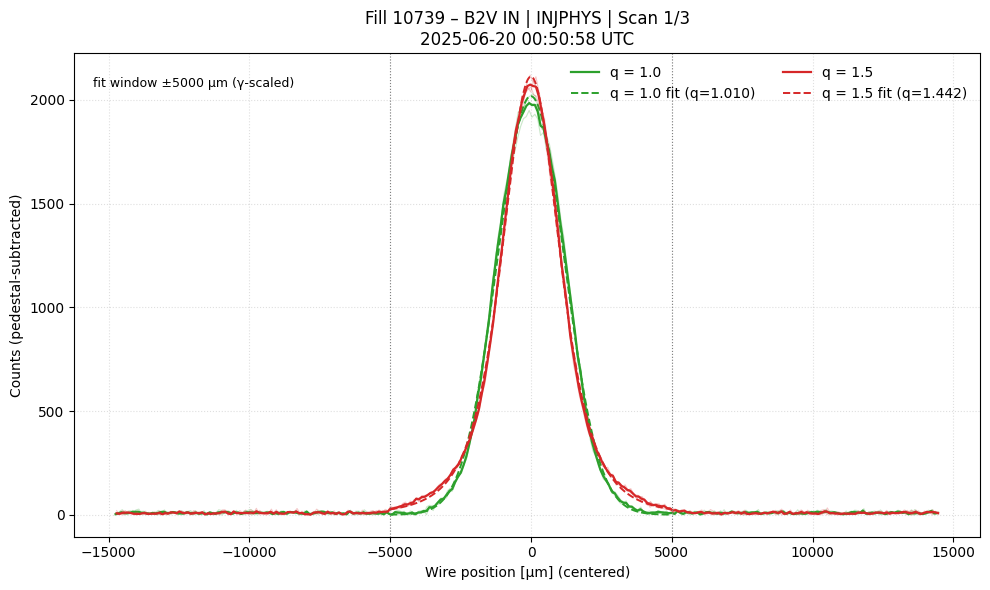

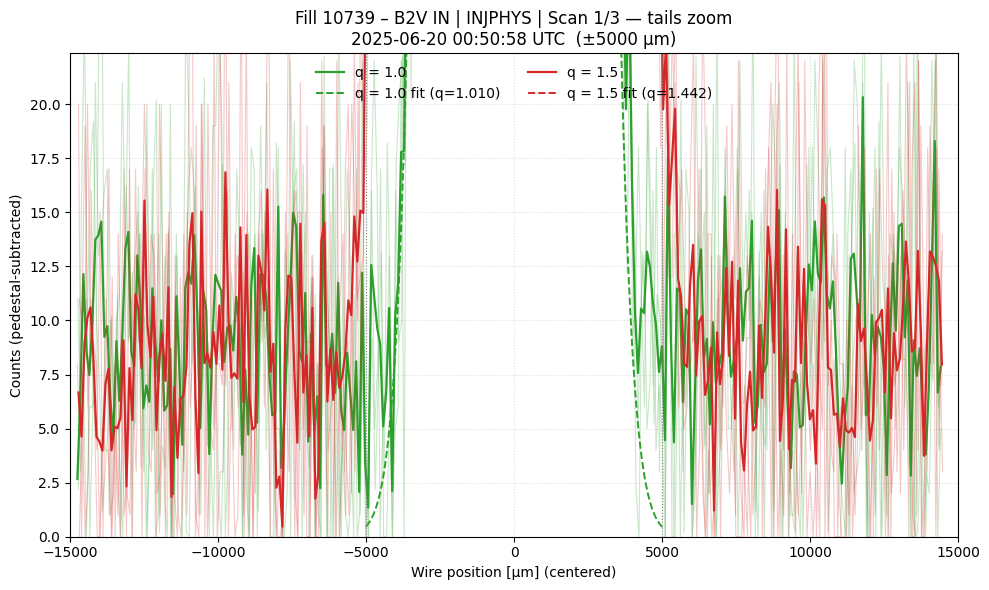

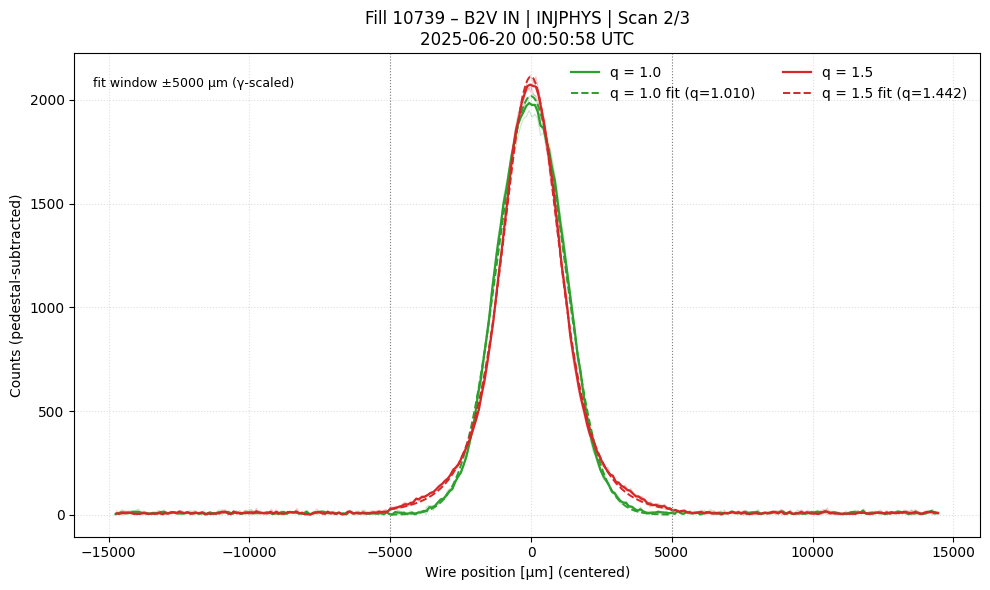

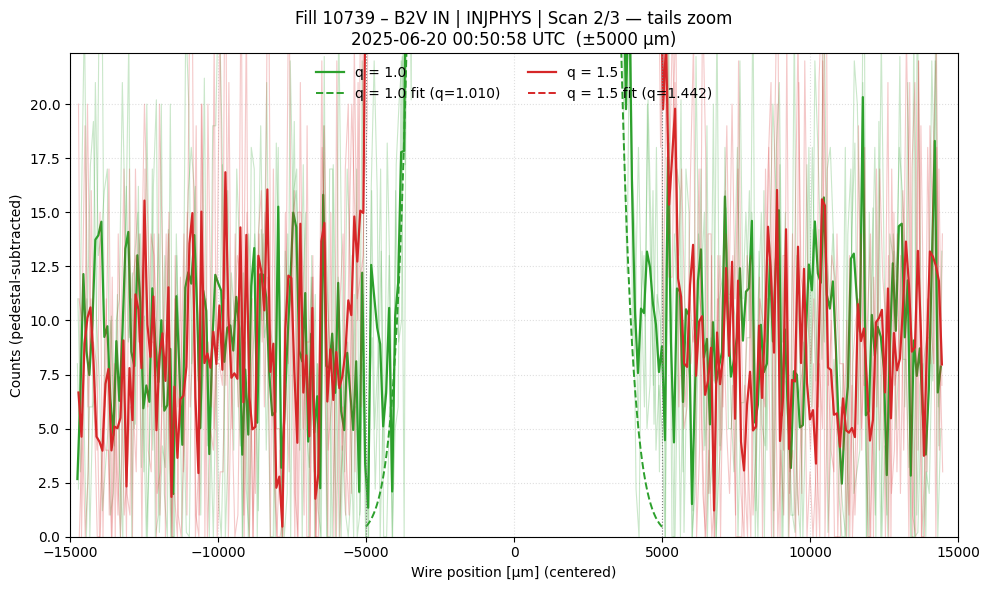

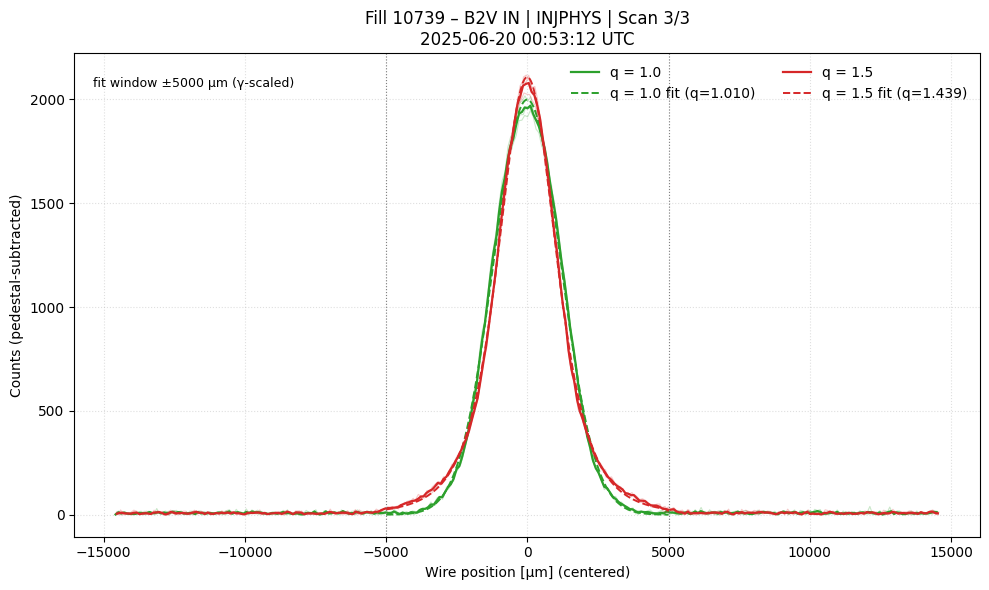

...

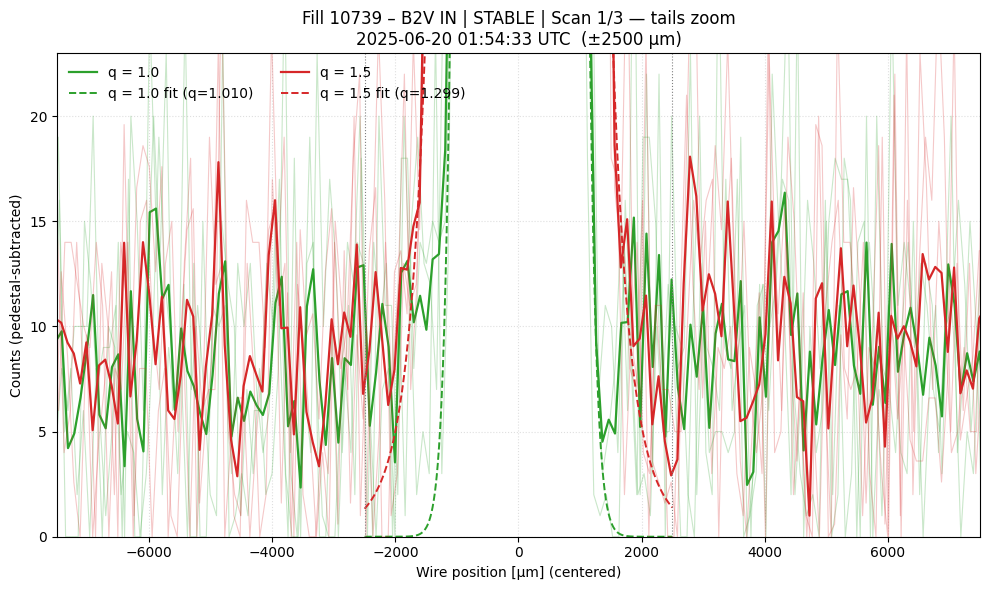

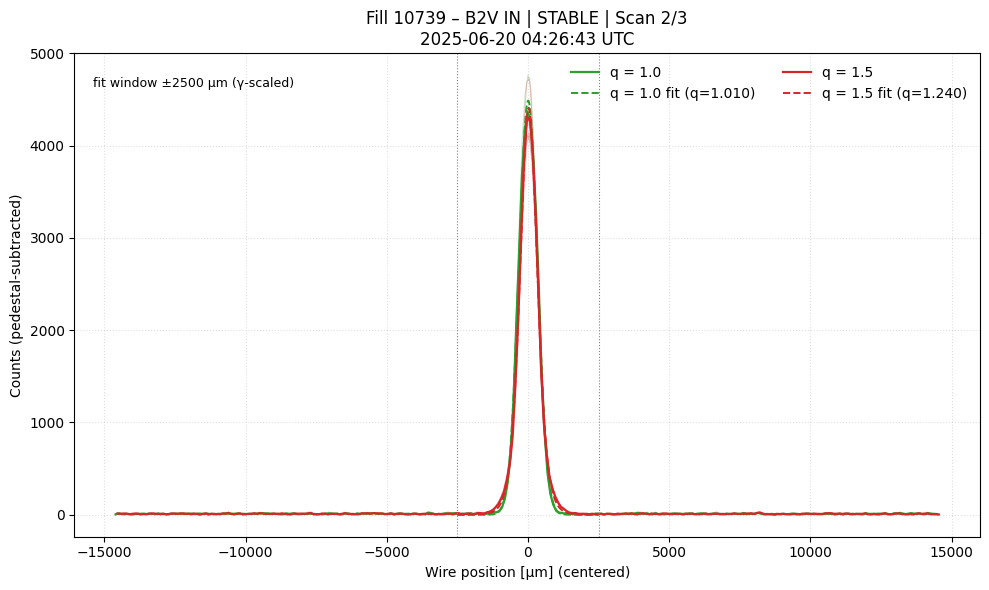

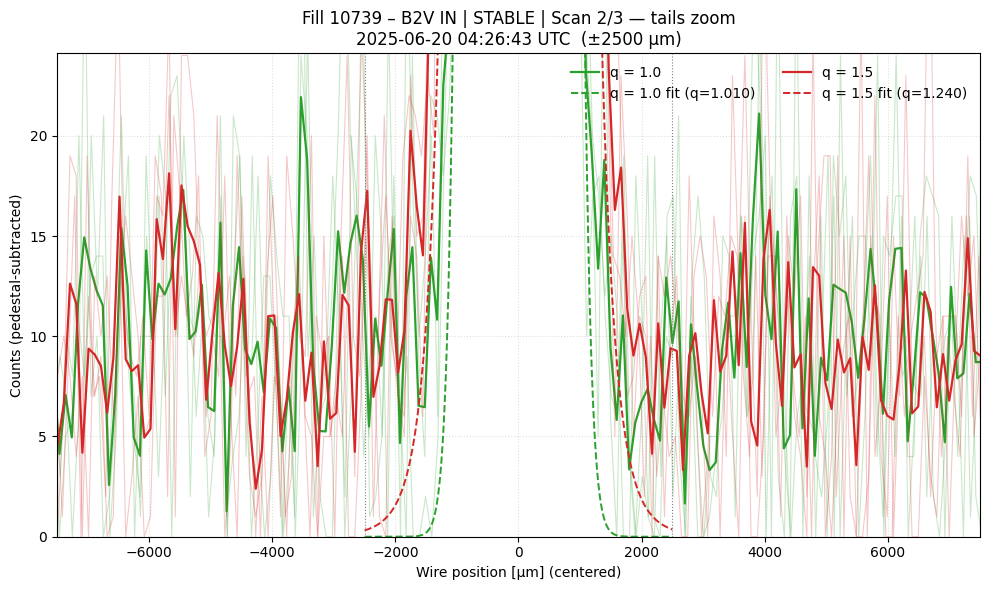

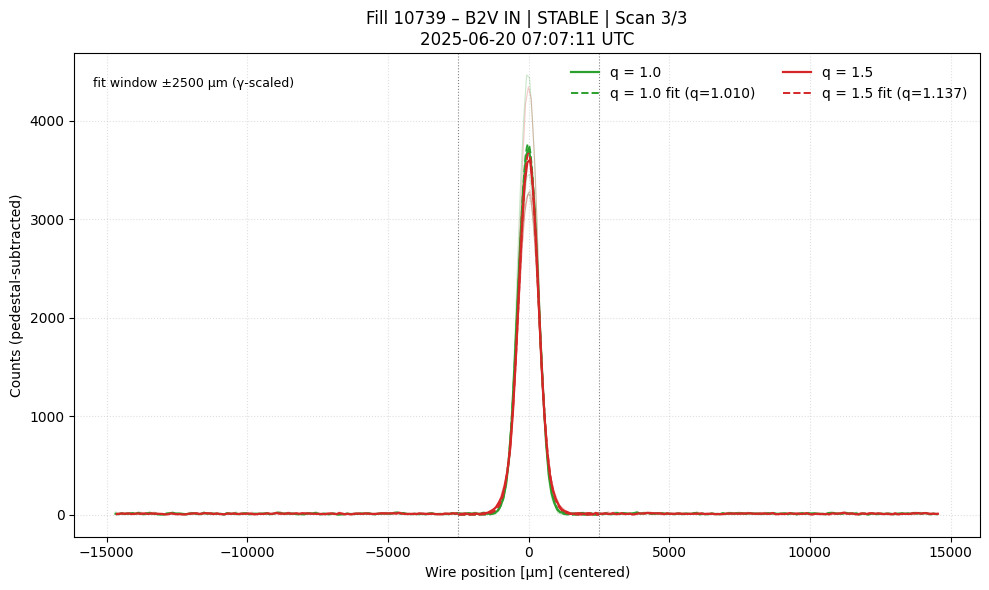

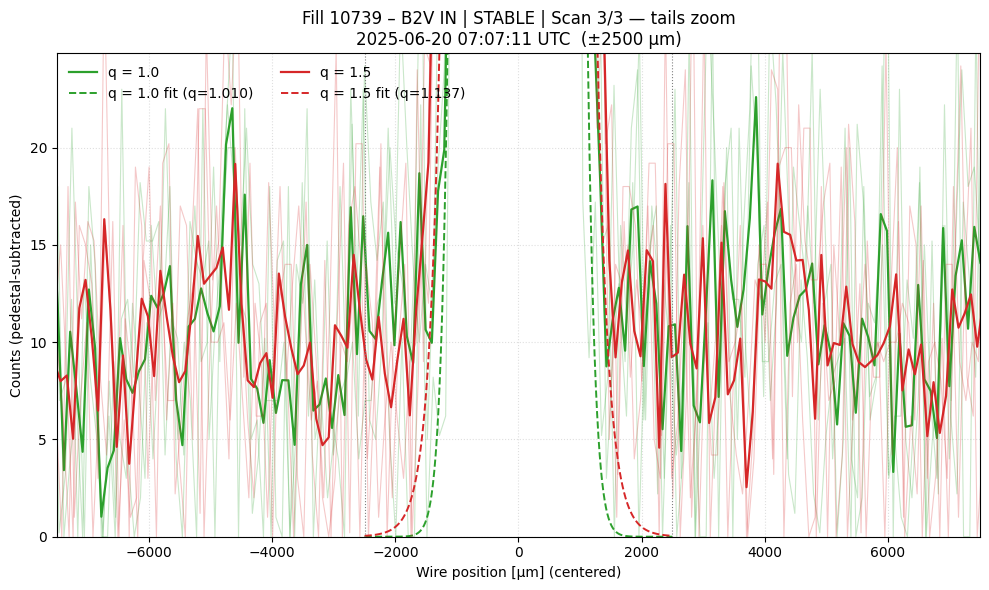

In [60]:
for ph, stamps in phase_scans.items():
    for i, ts in enumerate(stamps, 1):
        row = wsdf.loc[ts]

        # -------- original full‐view figure (unchanged) --------
        fig, ax = plt.subplots(figsize=(10, 6))
        for lbl, bunch_ids in GROUPS.items():
            fit_q_gaussian_to_group(
                row, bunch_ids, COLORS[lbl], ax, lbl,
                ts_for_window=ts, beta_ratio=1.0
            )
        win_um = fit_window_um(ts, phase_windows)
        ax.axvline(+win_um, color="grey", lw=0.8, ls=":")
        ax.axvline(-win_um, color="grey", lw=0.8, ls=":")
        ax.text(
            0.02, 0.95,
            f"fit window ±{int(win_um)} µm (γ-scaled)",
            transform=ax.transAxes, ha="left", va="top", fontsize=9
        )
        ax.set_title(
            f"Fill {FILL} – {DEVICE} {SCAN_KEY} | {ph} | Scan {i}/{len(stamps)}\n"
            f"{ts.strftime('%Y-%m-%d %H:%M:%S UTC')}"
        )
        ax.set_xlabel("Wire position [µm] (centered)")
        ax.set_ylabel("Counts (pedestal-subtracted)")
        ax.grid(ls=":", alpha=0.4)
        ax.legend(ncol=2, frameon=False)
        plt.tight_layout()
        plt.show()

        # -------- single‐panel tails-zoom figure (NEW) --------
        # recompute the group mean on the tails grid to get y_mean
        slots = list(map(int, row[slot_c]))
        xall, yall = row[pos_c], row[prof_c]
        # pick one group to extract x_ref, y_mean (they all share windows)
        # here we reuse the last LABEL loop, but you can pick either group
        x_ref, y_mean = None, None
        for lbl, bunch_ids in GROUPS.items():
            # same logic as in fit_q_gaussian_to_group but just for average
            xs, ys = [], []
            for b in bunch_ids:
                if b not in slots: continue
                j = slots.index(b)
                xr = np.asarray(xall[j], float)
                yr = pedestal_subtract(np.asarray(yall[j], float))
                xc, yc, _ = centre_profile(xr, yr)
                o = np.argsort(xc)
                xs.append(xc[o]); ys.append(yc[o])
            if xs:
                x_ref = xs[0]
                Y     = [np.interp(x_ref, xi, yi, left=0, right=0)
                         for xi, yi in zip(xs, ys)]
                y_mean = np.mean(np.vstack(Y), axis=0)
                break
        if x_ref is None:
            continue

        # now plot zoom
        figz, axz = plt.subplots(figsize=(10, 6))
        for lbl, bunch_ids in GROUPS.items():
            fit_q_gaussian_to_group(
                row, bunch_ids, COLORS[lbl], axz, lbl,
                ts_for_window=ts, beta_ratio=1.0
            )
        # restrict to ±3·win_um
        axz.set_xlim(-3*win_um, +3*win_um)
        # compute new y‐limit from the tails region (>±win_um)
        mask_tails = np.abs(x_ref) >= win_um
        if np.any(mask_tails):
            tail_max = np.nanmax(y_mean[mask_tails])
            axz.set_ylim(0, tail_max*1.1)

        axz.axvline(+win_um, color="grey", lw=0.8, ls=":")
        axz.axvline(-win_um, color="grey", lw=0.8, ls=":")
        axz.set_title(
            f"Fill {FILL} – {DEVICE} {SCAN_KEY} | {ph} | Scan {i}/{len(stamps)} — tails zoom\n"
            f"{ts.strftime('%Y-%m-%d %H:%M:%S UTC')}  (±{int(win_um)} µm)"
        )
        axz.set_xlabel("Wire position [µm] (centered)")
        axz.set_ylabel("Counts (pedestal-subtracted)")
        axz.grid(ls=":", alpha=0.4)
        axz.legend(ncol=2, frameon=False)
        plt.tight_layout()
        plt.show()


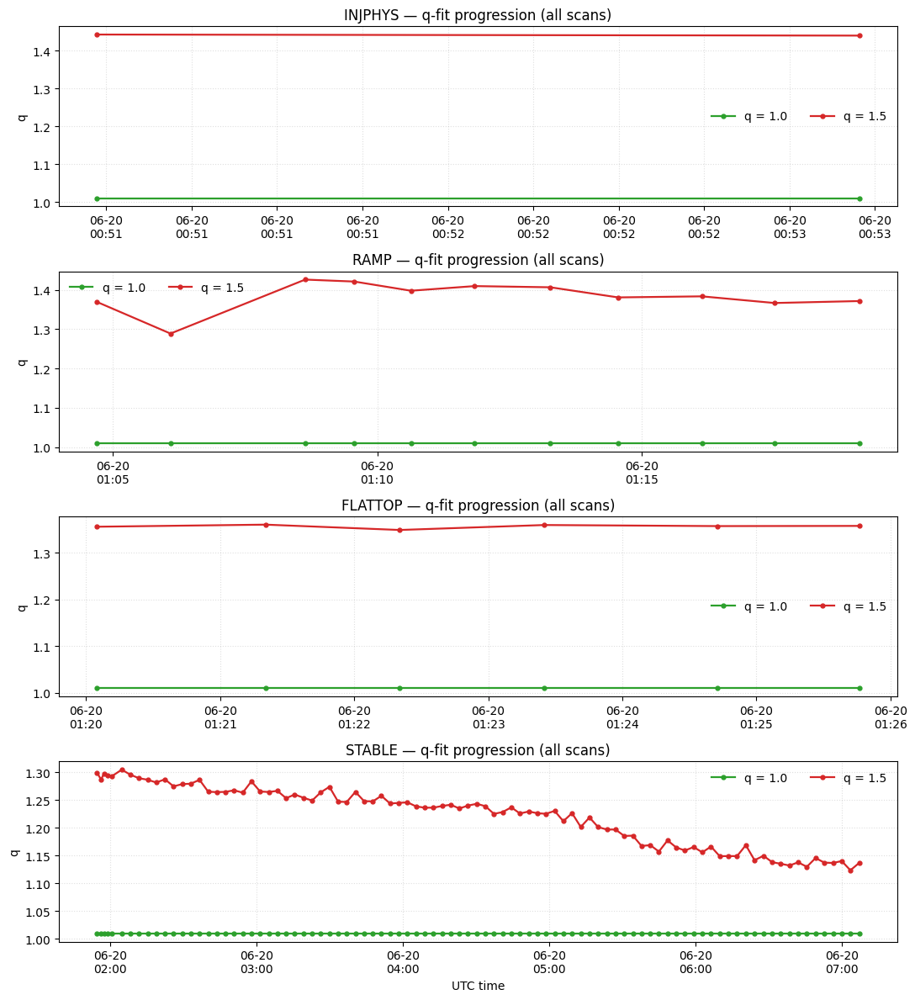

In [61]:
# =============== helper: q-fit for one row/group (no plotting) ===============
def qfit_for_group(row, bunch_ids, ts_for_window, beta_ratio=1.0):
    """
    Returns q (np.nan on failure) for the mean of 'bunch_ids' at timestamp ts_for_window,
    using pedestal-subtracted, centroid-centered traces and an energy-scaled fit window.
    """
    try:
        slots = list(map(int, row[slot_c]))
    except Exception:
        slots = list(row[slot_c])  # fallback if already int
    xall  = row[pos_c]
    yall  = row[prof_c]

    xs, ys = [], []
    for b in bunch_ids:
        if b not in slots:
            continue
        j  = slots.index(b)
        xr = np.asarray(xall[j], dtype=float)
        yr = pedestal_subtract(np.asarray(yall[j], dtype=float))
        xc, yc, _ = centre_profile(xr, yr)
        o = np.argsort(xc)
        xs.append(xc[o]); ys.append(yc[o])

    if not xs:
        return np.nan

    # align on first grid; average
    x_ref = xs[0]
    Y = [np.interp(x_ref, xi, yi, left=0, right=0) for xi, yi in zip(xs, ys)]
    y_mean = np.mean(np.vstack(Y), axis=0)

    # energy-scaled fit window
    win_um = fit_window_um(ts_for_window, phase_windows, beta_ratio=beta_ratio)
    msk    = np.abs(x_ref) <= win_um
    if not np.any(msk):
        # fallback: use all points if mask is empty
        msk = slice(None)

    # initial guesses & bounds
    A0   = float(y_mean[msk].max())
    mu0  = 0.0
    s    = float(y_mean[msk].sum())
    sig0 = (np.sqrt(np.sum((x_ref[msk] - mu0)**2 * y_mean[msk]) / s)
            if s > 0 else max(x_ref.ptp()/10, 1000.0))
    beta0 = 1.0 / (2.0 * max(sig0, 1.0)**2)
    q0    = 1.10
    p0    = (A0, mu0, beta0, q0)
    bounds= ([0.0, -5e3, 1e-12, 1.01], [np.inf, 5e3, np.inf, 2.5])

    try:
        popt, _ = curve_fit(q_gauss, x_ref[msk], y_mean[msk],
                            p0=p0, bounds=bounds, maxfev=20000)
        q = float(popt[3])
    except Exception:
        q = np.nan
    return q


# =============== build full time series of q for each phase ===============
records = []
for phase, win in phase_windows.items():
    # select all scans inside the phase window
    scans = wsdf.loc[win["start"]:win["end"]].copy()

    # Injection gating: after MIN_INJPHYS_TIME and ensure all required bunches
    if phase.upper() in ("INJPHYS", "IN"):
        scans = scans[scans.index >= MIN_INJPHYS_TIME]
        scans = scans[scans[slot_c].apply(lambda s: set(map(int, s)).issuperset(NEEDED))]

    if scans.empty:
        continue

    for ts, row in scans.iterrows():
        for label, blist in GROUPS.items():
            qv = qfit_for_group(row, blist, ts_for_window=ts, beta_ratio=1.0)
            records.append({"phase": phase, "group": label, "ts": ts, "q_fit": qv})

q_df = pd.DataFrame.from_records(records)
if q_df.empty:
    print("No q-fit data computed — check gating and inputs.")
else:
    q_df.sort_values("ts", inplace=True)
    q_df.set_index("ts", inplace=True)
    # optional: monotonic index per phase to allow rolling ops later
    # (not needed just to plot progression)


# =============== plot q progression for all scans, per phase ===============
import matplotlib.dates as mdates

if not q_df.empty:
    phases_plot = list(phase_windows.keys())  # preserve discovered order
    fig, axes = plt.subplots(len(phases_plot), 1,
                             figsize=(11, 3.0*len(phases_plot)), sharex=False)

    if len(phases_plot) == 1:
        axes = [axes]

    for ax, phase in zip(axes, phases_plot):
        for label, color in COLORS.items():
            sub = q_df[(q_df["phase"] == phase) & (q_df["group"] == label)]
            if sub.empty:
                continue
            ax.plot(sub.index, sub["q_fit"], marker='o', lw=1.6, ms=3.5,
                    color=color, label=label)
        ax.set_title(f"{phase} — q-fit progression (all scans)")
        ax.set_ylabel("q")
        ax.grid(ls=":", alpha=0.4)
        ax.xaxis.set_major_formatter(mdates.DateFormatter("%m-%d\n%H:%M"))
        ax.legend(frameon=False, ncol=2)

    axes[-1].set_xlabel("UTC time")
    plt.tight_layout()
    plt.show()


In [62]:
# pick the suspicious time (visually from your plot)
t0 = pd.Timestamp("2025-06-20 05:30:00", tz="UTC")  # adjust a bit if needed
sl = slice(t0 - pd.Timedelta("5min"), t0 + pd.Timedelta("5min"))

stable_win = phase_windows["STABLE"]
stable_scans = wsdf.loc[stable_win["start"]: stable_win["end"]].loc[sl].copy()

def present_bunches(row, bunch_ids):
    try:
        slots = set(map(int, row[slot_c]))
    except Exception:
        slots = set(row[slot_c])
    return sorted([b for b in bunch_ids if b in slots])

print("Scans in ±5 min window:")
for ts, row in stable_scans.iterrows():
    print(ts.strftime("%H:%M:%S"), 
          "q1:", present_bunches(row, GROUPS["q = 1.0"]),
          "q1_count:", len(present_bunches(row, GROUPS["q = 1.0"])))

# Also print the fit window used and some seeds
for ts, row in stable_scans.iterrows():
    win_um = fit_window_um(ts, phase_windows, beta_ratio=1.0)
    # crude amplitude/width proxies for the group (means the first bunch if present)
    slots = list(map(int, row[slot_c]))
    if GROUPS["q = 1.0"][0] in slots:
        j = slots.index(GROUPS["q = 1.0"][0])
        x = np.asarray(row[pos_c][j], float); y = np.asarray(row[prof_c][j], float)
        y = y - np.quantile(y, 0.10); y[y<0]=0
        x = x - (x*y).sum()/max(y.sum(),1)
        s = y.sum(); sig0 = np.sqrt(np.sum((x**2)*y)/s) if s>0 else np.nan
        A0 = y.max()
    else:
        A0 = np.nan; sig0=np.nan
    print(ts.strftime("%H:%M:%S"), f"Δx_fit={win_um:.0f} µm, A0≈{A0:.0f}, σ0≈{sig0:.0f}")


Scans in ±5 min window:
05:27:15 q1: [21, 501, 1051] q1_count: 3
05:30:48 q1: [21, 501, 1051] q1_count: 3
05:34:22 q1: [21, 501, 1051] q1_count: 3
05:27:15 Δx_fit=2500 µm, A0≈3834, σ0≈2374
05:30:48 Δx_fit=2500 µm, A0≈3803, σ0≈2372
05:34:22 Δx_fit=2500 µm, A0≈3741, σ0≈2492
